## Models

### Import Required Libraries

In [47]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D,Dense,MaxPool2D,Flatten,Input
from tensorflow.keras.regularizers import l2

### Partition and Visualize Data

In [96]:
df = pd.read_csv('../data/df.csv', sep = '\t')

df['combined'] = df['gender'] + "_" + df['subCategory'] + "_" + df['articleType'] + "_" + \
                 df['baseColour'] + "_" + df['season'] + "_" + df['usage']

df

,id,gender,subCategory,articleType,baseColour,season,usage,image_path,gender_enc,subCategory_enc,articleType_enc,baseColour_enc,season_enc,usage_enc,combined
0,15970,Men,Topwear,Shirts,Navy Blue,Fall/Winter,Casual,../data/images/15970.jpg,2,1,6,10,0,0,Men_Topwear_Shirts_Navy Blue_Fall/Winter_Casual
1,39386,Men,Bottomwear,Jeans,Blue,Spring/Summer,Casual,../data/images/39386.jpg,2,0,2,2,1,0,Men_Bottomwear_Jeans_Blue_Spring/Summer_Casual
2,21379,Men,Bottomwear,Track Pants,Black,Fall/Winter,Casual,../data/images/21379.jpg,2,0,12,1,0,0,Men_Bottomwear_Track Pants_Black_Fall/Winter_C...
3,53759,Men,Topwear,Tshirts,Grey,Spring/Summer,Casual,../data/images/53759.jpg,2,1,14,7,1,0,Men_Topwear_Tshirts_Grey_Spring/Summer_Casual
4,1855,Men,Topwear,Tshirts,Grey,Spring/Summer,Casual,../data/images/1855.jpg,2,1,14,7,1,0,Men_Topwear_Tshirts_Grey_Spring/Summer_Casual
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54338,13671,Unisex,Bottomwear,Jeans,Blue,Fall/Winter,Casual,../data/images/13671.jpg,3,0,2,2,0,0,Unisex_Bottomwear_Jeans_Blue_Fall/Winter_Casual
54339,33279,Unisex,Bottomwear,Jeans,Blue,Spring/Summer,Casual,../data/images/33279.jpg,3,0,2,2,1,0,Unisex_Bottomwear_Jeans_Blue_Spring/Summer_Casual
54340,13672,Unisex,Bottomwear,Jeans,Blue,Fall/Winter,Casual,../data/images/13672.jpg,3,0,2,2,0,0,Unisex_Bottomwear_Jeans_Blue_Fall/Winter_Casual
54341,33280,Unisex,Bottomwear,Jeans,Blue,Spring/Summer,Casual,../data/images/33280.jpg,3,0,2,2,1,0,Unisex_Bottomwear_Jeans_Blue_Spring/Summer_Casual


In [22]:
from sklearn.model_selection import train_test_split


# Calculate the value counts of the 'combined' column
combined_value_counts = df['combined'].value_counts()

# Find the combined values with a count of 1
combined_values_with_1_count = combined_value_counts[combined_value_counts == 1].index

# Remove rows with these combined values from the DataFrame
df_filtered = df[~df['combined'].isin(combined_values_with_1_count)]

# Split the filtered DataFrame into train and test sets while stratifying by 'combined'
train, test = train_test_split(df_filtered, test_size=0.2, random_state=123, stratify=df_filtered[['combined']])

# Append the rows with 1 count back to the train set
train = pd.concat([train, df[df['combined'].isin(combined_values_with_1_count)]])

# Verify the sizes of train and test sets
print("Original size:", len(df))
print("Train + Test size:", len(train), '+', len(test), '=', len(train) + len(test))

Original size: 54343
Train + Test size: 43481 + 10862 = 54343


In [23]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator


# Define image dimensions
img_height, img_width = 224, 224

# Define batch size
batch_size = 32

y_col = ["subCategory_enc", "articleType_enc", "gender_enc", "baseColour_enc", "season_enc", "usage_enc"]

# Create a custom data generator for training data
datagen = ImageDataGenerator(rescale=1.0/255.0,  # Normalize pixel values to the range [0, 1]
                            )

# Use the flow_from_dataframe method to load and preprocess training images from the DataFrame
train_generator = datagen.flow_from_dataframe(
    dataframe=train,
    x_col="image_path",  # Column name in the DataFrame that contains image paths
    y_col=y_col,  # List of columns containing labels
    target_size=(img_height, img_width),
    batch_size=batch_size,
#     subset="training",  # Specify training subset
    class_mode="multi_output",  # Use "multi_output" mode for multiple labels
    shuffle=True,  # Shuffle the data
    seed=123  # Random seed for reproducibility
)

# Use the flow_from_dataframe method to load and preprocess validation images from the DataFrame
validation_generator = datagen.flow_from_dataframe(
    dataframe=test, 
    x_col="image_path",  # Column name in the DataFrame that contains image paths
    y_col=y_col,  # List of columns containing labels
    target_size=(img_height, img_width),
    batch_size=batch_size,
#     subset="validation",  # Specify validation subset
    class_mode="multi_output",  # Use "multi_output" mode for multiple labels
    shuffle=False,  # No need to shuffle the validation data
    seed=123  # Random seed for reproducibility
)

# You can use the generated data for training and validation
# For example, you can fit a model using model.fit(train_generator, validation_data=validation_generator)

Found 43475 validated image filenames.


C:\Users\Lefteris_Souflas\anaconda3\lib\site-packages\keras\src\preprocessing\image.py:1137: UserWarning: Found 6 invalid image filename(s) in x_col="image_path". These filename(s) will be ignored.
  warnings.warn(


Found 10860 validated image filenames.


C:\Users\Lefteris_Souflas\anaconda3\lib\site-packages\keras\src\preprocessing\image.py:1137: UserWarning: Found 2 invalid image filename(s) in x_col="image_path". These filename(s) will be ignored.
  warnings.warn(


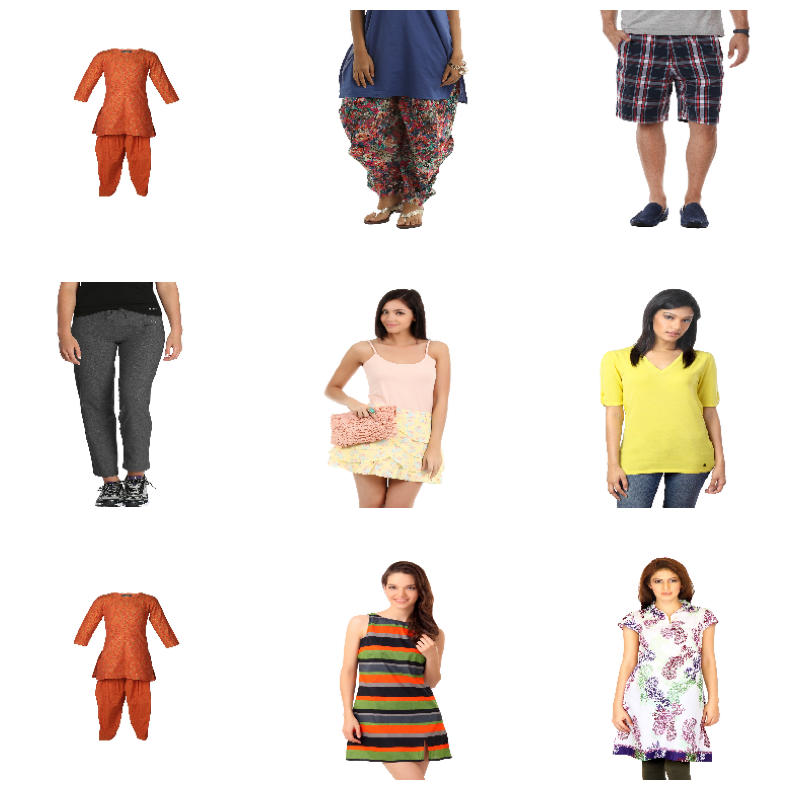

In [24]:
import matplotlib.pyplot as plt


# Generate a batch of images and labels from the train_generator
images, labels = train_generator.next()

# Create a grid for visualization
num_images = min(len(images), 9)  # Limit the number of images to 9 for a 3x3 grid
plt.figure(figsize=(10, 10))

for i in range(num_images):
    plt.subplot(3, 3, i + 1)
    plt.imshow(images[i])
#     plt.title("Label: " + labels[i])
    plt.axis("off")

plt.show()

### Import the Pre-trained Model

In [31]:
# Define image dimensions
img_height, img_width = 224, 224

# Define batch size
batch_size = 32

# Create the input layer
inputs = Input(shape=(img_height, img_width, 3))

# Create the convolutional layers
x = Conv2D(filters=32, padding="same", activation="relu", kernel_size=3, strides=2)(inputs)
x = MaxPool2D(pool_size=(2, 2), strides=2)(x)
x = Conv2D(filters=32, padding="same", activation="relu", kernel_size=3)(x)

# Flatten the output of the convolutional layers
x = Flatten()(x)

# Create the dense layers
x = Dense(128, activation='relu')(x)

# Define the number of classes for each output column
num_classes_gender = len(df['gender'].unique())
num_classes_articleType = len(df['articleType'].unique())
num_classes_baseColour = len(df['baseColour'].unique())
num_classes_season = len(df['season'].unique())
num_classes_usage = len(df['usage'].unique())

# Output layers for each output column
subCategory_output = Dense(1, kernel_regularizer=l2(0.01), activation="linear", name='subCategory_output')(x)
articleType_output = Dense(num_classes_articleType, kernel_regularizer=l2(0.01), activation="softmax", name='articleType_output')(x)
gender_output = Dense(num_classes_gender, kernel_regularizer=l2(0.01), activation="softmax", name='gender_output')(x)
baseColour_output = Dense(num_classes_baseColour, kernel_regularizer=l2(0.01), activation="softmax", name='baseColour_output')(x)
season_output = Dense(1, kernel_regularizer=l2(0.01), activation="linear", name='season_output')(x)
usage_output = Dense(num_classes_usage, kernel_regularizer=l2(0.01), activation="softmax", name='usage_output')(x)

# Create the model with multiple output layers
model = Model(inputs=inputs, outputs=[subCategory_output, articleType_output, gender_output,
                                      baseColour_output, season_output, usage_output])

# Compile the model with appropriate loss functions for each output
model.compile(optimizer='adam',
              loss={'subCategory_output': 'hinge',
                    'articleType_output': 'squared_hinge',
                    'gender_output': 'squared_hinge',
                    'baseColour_output': 'squared_hinge',
                    'season_output': 'hinge',
                    'usage_output': 'squared_hinge'},
              metrics=['accuracy'])

In [32]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d_7 (Conv2D)           (None, 112, 112, 32)         896       ['input_4[0][0]']             
                                                                                                  
 max_pooling2d_3 (MaxPoolin  (None, 56, 56, 32)           0         ['conv2d_7[0][0]']            
 g2D)                                                                                             
                                                                                                  
 conv2d_8 (Conv2D)           (None, 56, 56, 32)           9248      ['max_pooling2d_3[0][0]'

### Train Model

In [34]:
epochs=10
early_stopping_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', 
                                            patience=4, 
                                            verbose=1, 
                                            restore_best_weights=True)

checkpoint_filepath = 'checkpoints/SVM/weights.{epoch:02d}-{val_loss:.2f}.hdf5'
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_loss',
    mode='min',
    save_best_only=True)

history = model.fit(train_generator, validation_data=validation_generator, epochs=epochs,
                    callbacks=[early_stopping_callback, model_checkpoint_callback])

Epoch 1/10
1359/1359 [==============================] - 1881s 1s/step - loss: 2.0527 - subCategory_output_loss: 0.0045 - articleType_output_loss: 0.3529 - gender_output_loss: 0.2579 - baseColour_output_loss: 0.4123 - season_output_loss: 0.1683 - usage_output_loss: 0.8421 - subCategory_output_accuracy: 0.9982 - articleType_output_accuracy: 0.0599 - gender_output_accuracy: 0.1251 - baseColour_output_accuracy: 0.0756 - season_output_accuracy: 0.9258 - usage_output_accuracy: 0.2127 - val_loss: 2.0458 - val_subCategory_output_loss: 0.0045 - val_articleType_output_loss: 0.3538 - val_gender_output_loss: 0.2583 - val_baseColour_output_loss: 0.4120 - val_season_output_loss: 0.1631 - val_usage_output_loss: 0.8422 - val_subCategory_output_accuracy: 0.9979 - val_articleType_output_accuracy: 0.0529 - val_gender_output_accuracy: 0.1359 - val_baseColour_output_accuracy: 0.0583 - val_season_output_accuracy: 0.9193 - val_usage_output_accuracy: 0.0864
Epoch 2/10
1359/1359 [==============================

In [35]:
# Export model
model.save('SVM/trained_model')
# model = load.model('xxx.hdf5')
# # The model weights (that are considered the best) are loaded into the model.
# model.load_weights(checkpoint_filepath)

Cause: Unable to locate the source code of <function trace_model_call.<locals>._wrapped_model at 0x0000026A894934C0>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Cause: Unable to locate the source code of <function trace_model_call.<locals>._wrapped_model at 0x0000026A894934C0>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get 

Cause: Unable to locate the source code of <function Layer._handle_weight_regularization.<locals>._loss_for_variable at 0x0000026A89534280>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Cause: Unable to locate the source code of <function Layer._handle_weight_regularization.<locals>._loss_for_variable at 0x0000026A89534280>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Cause: Unable to locate the source code of <function Layer._handle_weight_regularization.<locals>._loss_for_variable at 0x0000026A89534C10>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.

Cause: Unable to locate the source code of <function Layer._handle_weight_regularization.<locals>._loss_for_variable at 0x0000026A89534C10>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Cause: Unable to locate the source code of <function Layer._handle_weight_regularization.<locals>._loss_for_variable at 0x0000026A89534C10>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Cause: Unable to locate the source code of <function Layer._handle_weight_regularization.<locals>._loss_for_variable at 0x0000026A89534820>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.

Cause: Unable to locate the source code of <function Layer._handle_weight_regularization.<locals>._loss_for_variable at 0x0000026A89534820>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Cause: Unable to locate the source code of <function Layer._handle_weight_regularization.<locals>._loss_for_variable at 0x0000026A89534820>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Cause: Unable to locate the source code of <function Layer._handle_weight_regularization.<locals>._loss_for_variable at 0x0000026A89534EE0>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.

Cause: Unable to locate the source code of <function Layer._handle_weight_regularization.<locals>._loss_for_variable at 0x0000026A89534EE0>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Cause: Unable to locate the source code of <function Layer._handle_weight_regularization.<locals>._loss_for_variable at 0x0000026A89534EE0>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Cause: Unable to locate the source code of <function Layer._handle_weight_regularization.<locals>._loss_for_variable at 0x0000026A88BD75E0>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.

Cause: Unable to locate the source code of <function Layer._handle_weight_regularization.<locals>._loss_for_variable at 0x0000026A88BD75E0>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Cause: Unable to locate the source code of <function Layer._handle_weight_regularization.<locals>._loss_for_variable at 0x0000026A88BD75E0>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Cause: Unable to locate the source code of <function Layer._handle_weight_regularization.<locals>._loss_for_variable at 0x0000026A89A2A160>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.

Cause: Unable to locate the source code of <function Layer._handle_weight_regularization.<locals>._loss_for_variable at 0x0000026A89A2A160>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Cause: Unable to locate the source code of <function Layer._handle_weight_regularization.<locals>._loss_for_variable at 0x0000026A89A2A160>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
INFO:tensorflow:Assets written to: SVM/trained_model\assets


INFO:tensorflow:Assets written to: SVM/trained_model\assets


### Evaluate Model

In [36]:
# Combine the lists into a 2D array
accuracy_matrix = np.array([history.history['subCategory_output_accuracy'], 
                            history.history['articleType_output_accuracy'], 
                            history.history['gender_output_accuracy'], 
                            history.history['baseColour_output_accuracy'], 
                            history.history['season_output_accuracy'], 
                            history.history['usage_output_accuracy']])

# Calculate the average for each position (across all lists)
accuracy = np.mean(accuracy_matrix, axis=0)

In [37]:
# Combine the lists into a 2D array
val_accuracy_matrix = np.array([history.history['val_subCategory_output_accuracy'], 
                            history.history['val_articleType_output_accuracy'], 
                            history.history['val_gender_output_accuracy'], 
                            history.history['val_baseColour_output_accuracy'], 
                            history.history['val_season_output_accuracy'], 
                            history.history['val_usage_output_accuracy']])

# Calculate the average for each position (across all lists)
val_accuracy = np.mean(val_accuracy_matrix, axis=0)

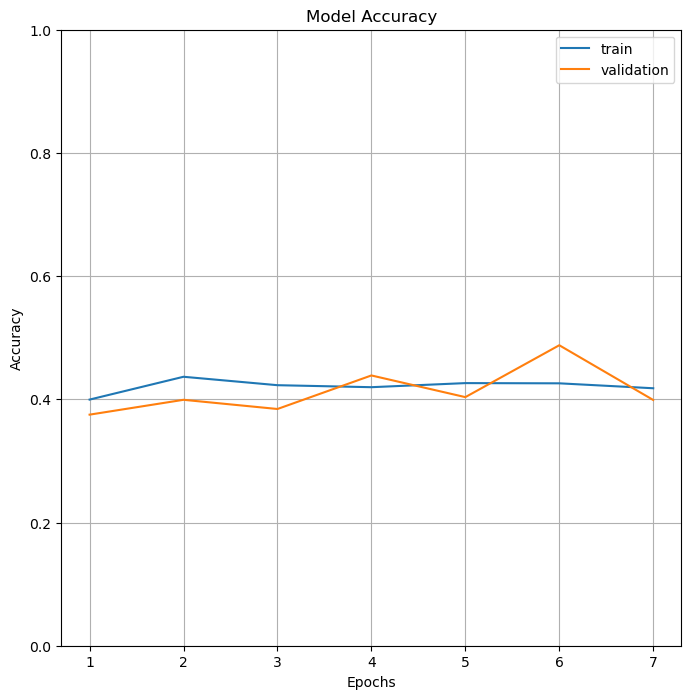

In [134]:
import matplotlib.pyplot as plotter_lib


plotter_lib.figure(figsize=(8, 8))
epochs_range= range(1, 8)
plotter_lib.plot(epochs_range, accuracy, label="Training Accuracy")
plotter_lib.plot(epochs_range, val_accuracy, label="Validation Accuracy")
plotter_lib.axis(ymin=0,ymax=1)
plotter_lib.grid()
plotter_lib.title('Model Accuracy')
plotter_lib.ylabel('Accuracy')
plotter_lib.xlabel('Epochs')
_ = plotter_lib.legend(['train', 'validation'])

# plotter_lib.show()
# plotter_lib.savefig('output-plot_accuracy.png') 

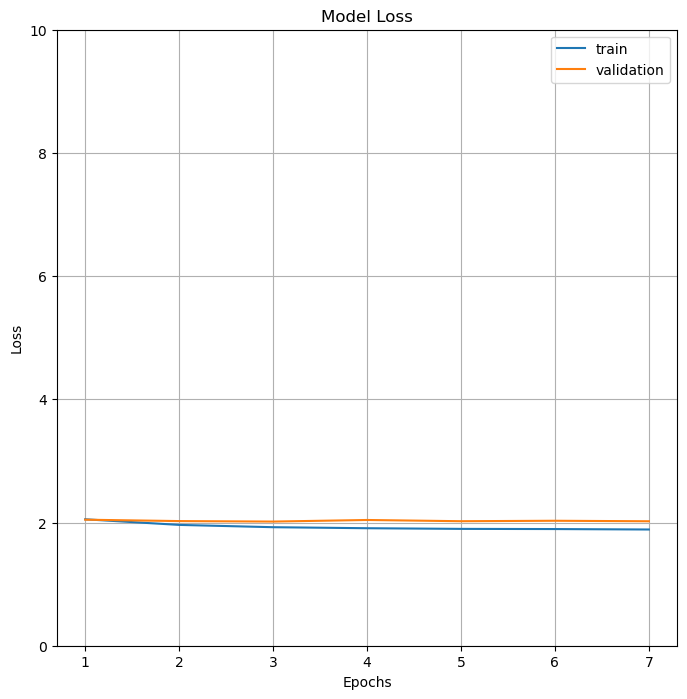

In [133]:
plotter_lib.figure(figsize=(8, 8))
epochs_range= range(1, 8)
plotter_lib.plot( epochs_range, history.history['loss'], label="Training Loss")
plotter_lib.plot(epochs_range, history.history['val_loss'], label="Validation Loss")
plotter_lib.axis(ymin=0,ymax=10)
plotter_lib.grid()
plotter_lib.title('Model Loss')
plotter_lib.ylabel('Loss')
plotter_lib.xlabel('Epochs')
_ = plotter_lib.legend(['train', 'validation'])

# plotter_lib.show()
# plotter_lib.savefig('output-plot_loss.png') 

In [52]:
@tf.autograph.experimental.do_not_convert
y_pred = model.predict(validation_generator)
y_pred  # list of arrays

[array([[-5.1675034],
        [-3.4602158],
        [ 2.3626277],
        ...,
        [ 3.9002357],
        [ 3.3227332],
        [-4.0957913]], dtype=float32),
 array([[0.06239766, 0.06253736, 0.06262734, ..., 0.0627389 , 0.0624927 ,
         0.06265537],
        [0.06247353, 0.06258047, 0.06242375, ..., 0.06244935, 0.06270847,
         0.06239824],
        [0.06247912, 0.06251616, 0.06245287, ..., 0.06247646, 0.06246706,
         0.06247374],
        ...,
        [0.06252234, 0.06252968, 0.06249624, ..., 0.0625445 , 0.06247811,
         0.06228501],
        [0.06247903, 0.06248074, 0.06252578, ..., 0.06253504, 0.06242427,
         0.06246074],
        [0.06242064, 0.06253182, 0.06243116, ..., 0.0625622 , 0.06268488,
         0.06233397]], dtype=float32),
 array([[0.20457894, 0.20111541, 0.20216395, 0.19286864, 0.19927305],
        [0.20115967, 0.20062119, 0.2016549 , 0.19692513, 0.1996391 ],
        [0.20010611, 0.20050499, 0.19991453, 0.19955875, 0.19991566],
        ...,
        [

In [53]:
y_true = validation_generator.labels
y_true

[array([0, 0, 1, ..., 1, 1, 0]),
 array([ 2,  7,  6, ..., 14,  1,  8]),
 array([2, 4, 2, ..., 2, 4, 4]),
 array([ 1,  3, 16, ..., 16,  4,  5]),
 array([1, 0, 1, ..., 1, 1, 0]),
 array([0, 0, 0, ..., 0, 0, 0])]

In [106]:
# Create a DataFrame to store the encoded values and their corresponding labels
subCategory_labels = df[['subCategory_enc', 'subCategory']].drop_duplicates().\
    sort_values(by='subCategory_enc')['subCategory'].tolist()
articleType_labels = df[['articleType_enc', 'articleType']].drop_duplicates().\
    sort_values(by='articleType_enc')['articleType'].tolist()
gender_labels = df[['gender_enc', 'gender']].drop_duplicates().\
    sort_values(by='gender_enc')['gender'].tolist()
baseColour_labels = df[['baseColour_enc', 'baseColour']].drop_duplicates().\
    sort_values(by='baseColour_enc')['baseColour'].tolist()
season_labels = df[['season_enc', 'season']].drop_duplicates().\
    sort_values(by='season_enc')['season'].tolist()
usage_labels = df[['usage_enc', 'usage']].drop_duplicates().\
    sort_values(by='usage_enc')['usage'].tolist()

target_names = [subCategory_labels, articleType_labels, gender_labels,
                baseColour_labels, season_labels, usage_labels]

# Print the result
print(target_names)

[['Bottomwear', 'Topwear'], ['Capris', 'Jackets', 'Jeans', 'Kurtas', 'Leggings', 'Patiala', 'Shirts', 'Shorts', 'Skirts', 'Sweaters', 'Sweatshirts', 'Tops', 'Track Pants', 'Trousers', 'Tshirts', 'Tunics'], ['Boys', 'Girls', 'Men', 'Unisex', 'Women'], ['Beige', 'Black', 'Blue', 'Brown', 'Charcoal', 'Cream', 'Green', 'Grey', 'Maroon', 'Multi', 'Navy Blue', 'Olive', 'Orange', 'Pink', 'Purple', 'Red', 'White', 'Yellow'], ['Fall/Winter', 'Spring/Summer'], ['Casual', 'Ethnic', 'Formal', 'Sports']]


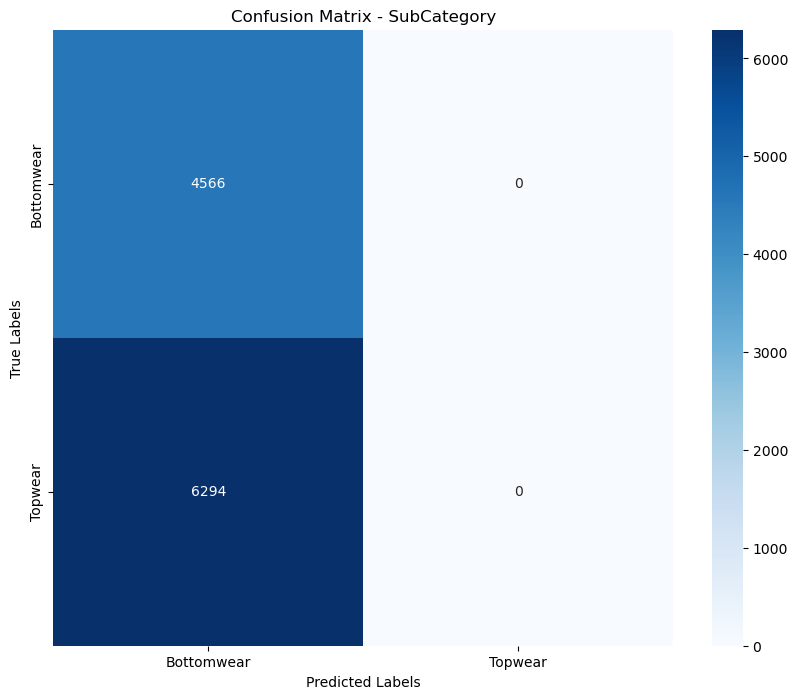

SubCategory Classification Report:

              precision    recall  f1-score   support

  Bottomwear       0.42      1.00      0.59      4566
     Topwear       0.00      0.00      0.00      6294

    accuracy                           0.42     10860
   macro avg       0.21      0.50      0.30     10860
weighted avg       0.18      0.42      0.25     10860



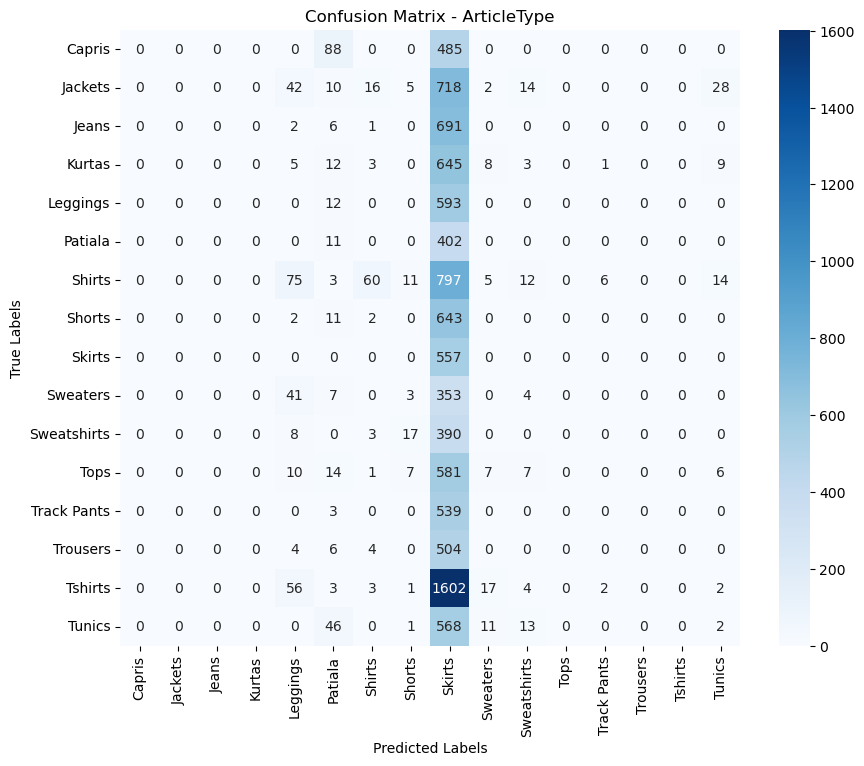

ArticleType Classification Report:

              precision    recall  f1-score   support

      Capris       0.00      0.00      0.00       573
     Jackets       0.00      0.00      0.00       835
       Jeans       0.00      0.00      0.00       700
      Kurtas       0.00      0.00      0.00       686
    Leggings       0.00      0.00      0.00       605
     Patiala       0.05      0.03      0.03       413
      Shirts       0.65      0.06      0.11       983
      Shorts       0.00      0.00      0.00       658
      Skirts       0.06      1.00      0.10       557
    Sweaters       0.00      0.00      0.00       408
 Sweatshirts       0.00      0.00      0.00       418
        Tops       0.00      0.00      0.00       633
 Track Pants       0.00      0.00      0.00       542
    Trousers       0.00      0.00      0.00       518
     Tshirts       0.00      0.00      0.00      1690
      Tunics       0.03      0.00      0.01       641

    accuracy                           0.06 

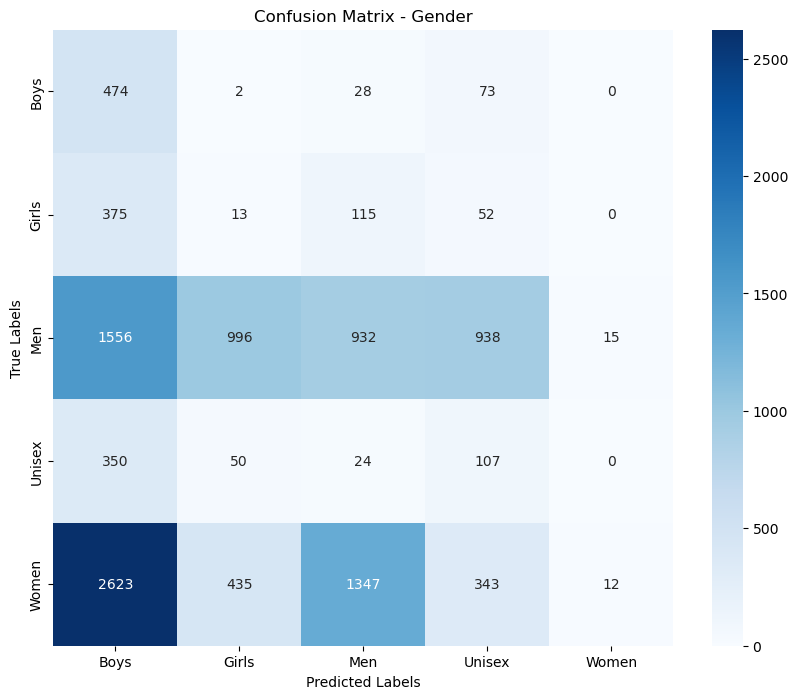

Gender Classification Report:

              precision    recall  f1-score   support

        Boys       0.09      0.82      0.16       577
       Girls       0.01      0.02      0.01       555
         Men       0.38      0.21      0.27      4437
      Unisex       0.07      0.20      0.10       531
       Women       0.44      0.00      0.01      4760

    accuracy                           0.14     10860
   macro avg       0.20      0.25      0.11     10860
weighted avg       0.36      0.14      0.13     10860



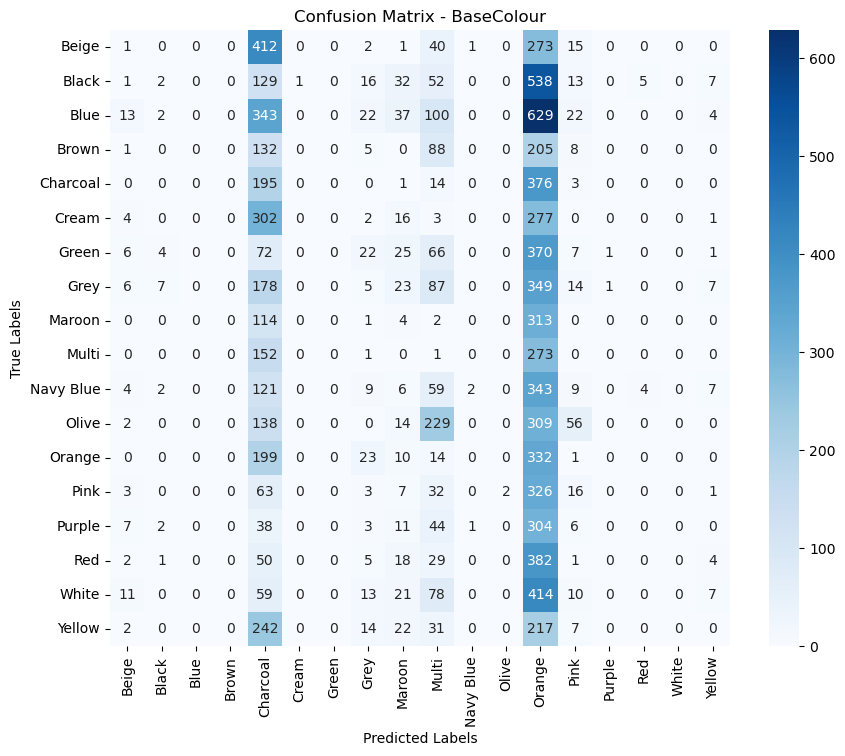

BaseColour Classification Report:

              precision    recall  f1-score   support

       Beige       0.02      0.00      0.00       745
       Black       0.10      0.00      0.00       796
        Blue       0.00      0.00      0.00      1172
       Brown       0.00      0.00      0.00       439
    Charcoal       0.07      0.33      0.11       589
       Cream       0.00      0.00      0.00       605
       Green       0.00      0.00      0.00       574
        Grey       0.03      0.01      0.01       677
      Maroon       0.02      0.01      0.01       434
       Multi       0.00      0.00      0.00       427
   Navy Blue       0.50      0.00      0.01       566
       Olive       0.00      0.00      0.00       748
      Orange       0.05      0.57      0.10       579
        Pink       0.09      0.04      0.05       453
      Purple       0.00      0.00      0.00       416
         Red       0.00      0.00      0.00       492
       White       0.00      0.00      0.00   

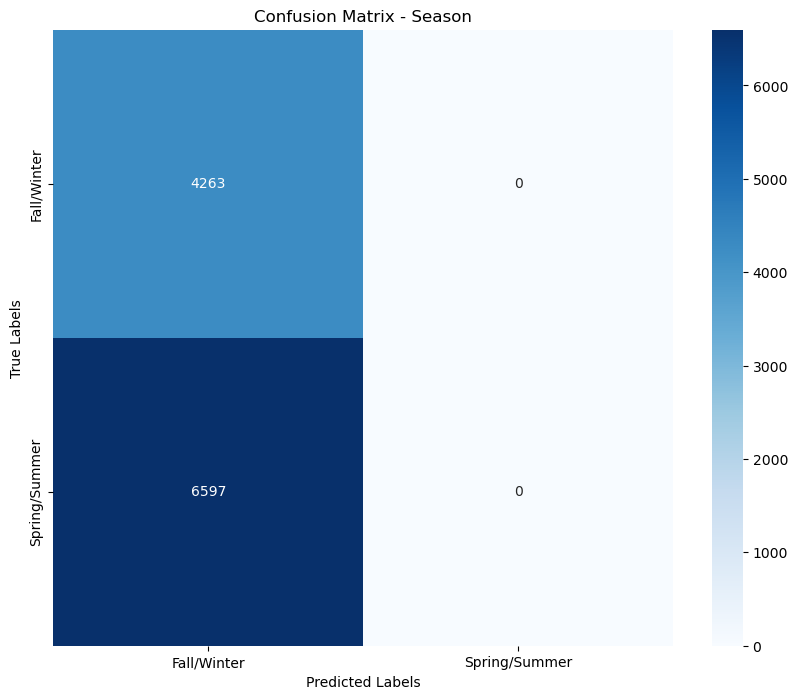

Season Classification Report:

               precision    recall  f1-score   support

  Fall/Winter       0.39      1.00      0.56      4263
Spring/Summer       0.00      0.00      0.00      6597

     accuracy                           0.39     10860
    macro avg       0.20      0.50      0.28     10860
 weighted avg       0.15      0.39      0.22     10860



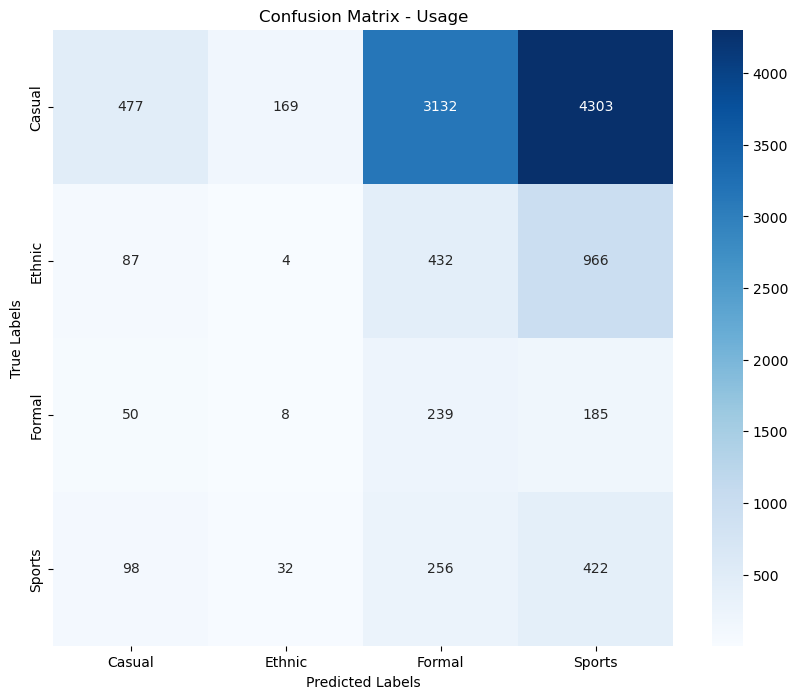

Usage Classification Report:

              precision    recall  f1-score   support

      Casual       0.67      0.06      0.11      8081
      Ethnic       0.02      0.00      0.00      1489
      Formal       0.06      0.50      0.11       482
      Sports       0.07      0.52      0.13       808

    accuracy                           0.11     10860
   macro avg       0.20      0.27      0.09     10860
weighted avg       0.51      0.11      0.10     10860



In [186]:
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go


output = ["SubCategory", "ArticleType", "Gender", "BaseColour", "Season", "Usage"]

for i, y_pred_output in enumerate(y_pred):
    
    # Confusion Matrix
    y_true_output = y_true[i]  # Get the corresponding true labels for this output
    y_pred_labels = np.argmax(y_pred_output, axis=1)  # Convert predicted probabilities to labels
    # Generate confusion matrix
    cm = confusion_matrix(y_true_output, y_pred_labels)
    # Plot confusion matrix using seaborn heatmap
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=output_labels[i], yticklabels=output_labels[i])
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title("Confusion Matrix - " + output[i])
    plt.show()
    
    # Classification Report
    print(output[i], "Classification Report:\n")
    y_true_output = y_true[i]  # Get the corresponding true labels for this output
    y_pred_probs = y_pred_output  # Use predicted probabilities instead of labels
    # Print classification report for this output
    print(classification_report(y_true_output, np.argmax(y_pred_probs, axis=1), labels=np.unique(y_true_output), 
                                target_names=target_names[i], zero_division=0))
    
    # ROC Curve - AUC
    fig = go.Figure()
    if len(target_names[i]) == 2:
        # Reshape y_pred_probs to match the shape of y_true_output
        y_pred_probs = y_pred_probs.reshape(-1)  # Flatten to 1D array

        # Calculate ROC curve
        fpr, tpr, _ = roc_curve(y_true_output, y_pred_probs)
        roc_auc = auc(fpr, tpr)

        # Plot ROC curve
        fig.add_trace(go.Scatter(x=fpr, y=tpr, mode='lines', name=f'ROC curve (AUC = {roc_auc:.2f})'))
    
    if len(target_names[i]) > 2:  # Multiclass case
        # Calculate ROC curve for each class in the current output
        fpr = dict()
        tpr = dict()
        roc_auc = dict()

        for class_idx in range(len(target_names[i])):
            fpr[class_idx], tpr[class_idx], _ = roc_curve(y_true_output == class_idx, y_pred_probs[:, class_idx])
            roc_auc[class_idx] = auc(fpr[class_idx], tpr[class_idx])

        # Plot ROC curves for each class
        for class_idx in range(len(target_names[i])):
            fig.add_trace(go.Scatter(x=fpr[class_idx], y=tpr[class_idx], mode='lines',
                                     name=f'{target_names[i][class_idx]} (AUC = {roc_auc[class_idx]:.2f})'))

    fig.add_trace(go.Scatter(x=[0, 1], y=[0, 1], mode='lines', line=dict(dash='dash'), name='Random Guess'))

    fig.update_layout(
        title=f'ROC Curve - {output[i]}',
        xaxis_title='False Positive Rate',
        yaxis_title='True Positive Rate',
        xaxis=dict(range=[0, 1]),
        yaxis=dict(range=[0, 1]),
        legend=dict(x=1, y=0, traceorder='normal'),
        plot_bgcolor='#F4F5F3',
    )

    fig.show()

### Model Inference

In [ ]:
# import cv2


# # Assuming you have a list of class names corresponding to the output classes
# class_names = ['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips']

# path = 'C:\\Users\\Lefteris_Souflas\\.keras\\datasets\\flower_photos\\daisy\\5547758_eea9edfd54_n.jpg'

# # Load the sample image
# sample_image = cv2.imread(path)
# sample_image_resized = cv2.resize(sample_image, (img_height, img_width))
# sample_image = np.expand_dims(sample_image_resized, axis=0)

# # Make predictions
# image_pred = resnet_model.predict(sample_image)

# # Get the predicted class index
# predicted_class_index = np.argmax(image_pred)

# # Get the corresponding human-readable class label
# image_output_class = class_names[predicted_class_index]

# # Print the predicted class label
# print("The predicted class is", image_output_class)
